<a href="https://colab.research.google.com/github/avicennamumtaza/courses-computervision/blob/main/general.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Load Images and Videos**

In [ ]:
from google.colab import drive

drive.mount('/content/drive')
# /content/drive/MyDrive/PCVK/belajar

Mounted at /content/drive


In [ ]:
!pip install opencv-contrib-python
!pip install caer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 809.5/809.5 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.5/12.5 MB 60.8 MB/s eta 0:00:00


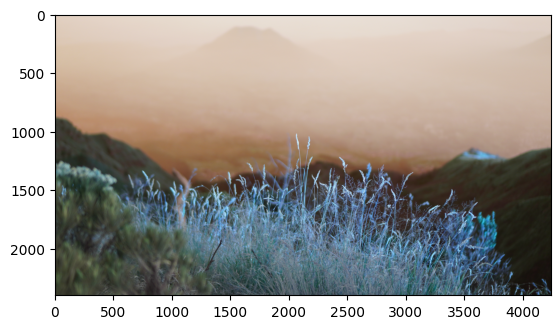

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt

imgPemandangan = cv.imread('/content/drive/MyDrive/PCVK/belajar/pemandangan.JPG')
plt.imshow(imgPemandangan)

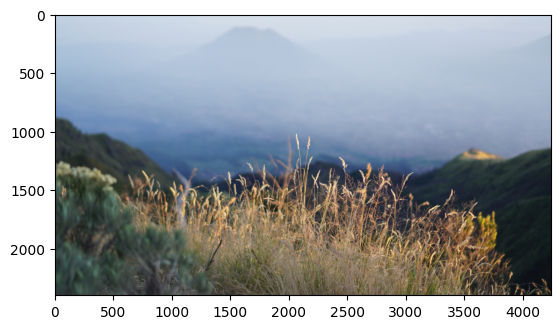

In [ ]:
plt.imshow(cv.cvtColor(imgPemandangan, cv.COLOR_BGR2RGBA))

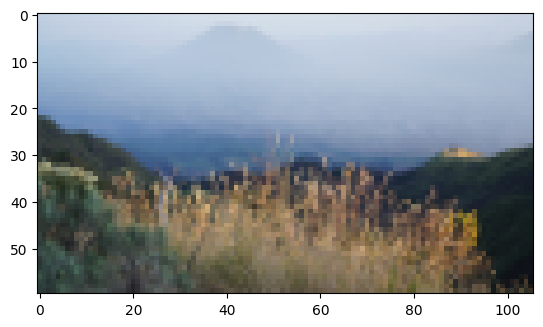

In [ ]:
def rescaleFrame(frame, scale=0.025):
  w = int(frame.shape[1] * scale)
  h = int(frame.shape[0] * scale)
  dimension = (w, h)
  return cv.resize(frame, dimension, interpolation=cv.INTER_AREA)

plt.imshow(cv.cvtColor(rescaleFrame(imgPemandangan), cv.COLOR_BGR2RGBA))

In [ ]:
# import cv2 as cv
# import matplotlib.pyplot as plt
# from google.colab.patches import cv2_imshow
# import time

# vidAzaIza = cv.VideoCapture('/content/drive/MyDrive/PCVK/belajar/azaiza.mp4')

# while vidAzaIza.isOpened():
#     isTrue, frame = vidAzaIza.read()
#     if not isTrue:
#         print("Tidak ada frame lagi atau gagal membaca video.")
#         break
#     frame_rgb = cv.cvtColor(rescaleFrame(frame), cv.COLOR_BGR2RGB)

#     plt.imshow(frame_rgb)
#     plt.axis('off')
#     plt.show()

#     # Tambahkan sedikit delay agar video tidak tampil terlalu cepat
#     time.sleep(0.05)

# # Setelah selesai, lepaskan video capture
# vidAzaIza.release()

# **Create an Image**

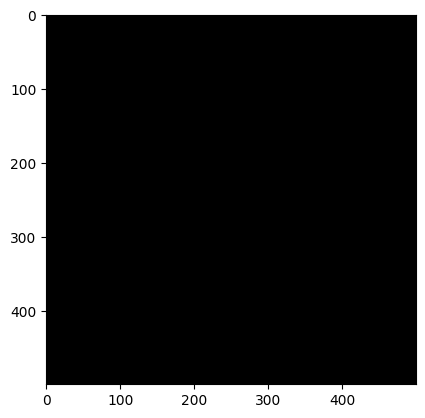

In [ ]:
import numpy as np

blank = np.zeros((500, 500, 3), dtype='uint8')
# args: (w, h, total layer of color/rgb), type image/uint8
plt.imshow(blank)

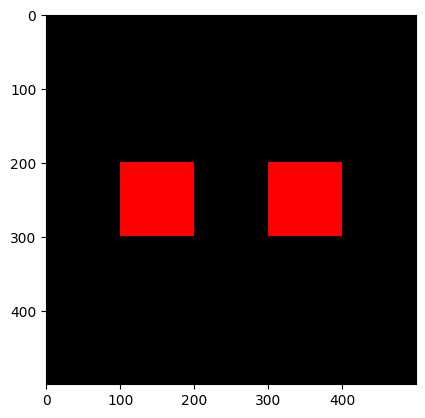

In [ ]:
# blank[:] = 0, 0, 0
blank[200:300, 300:400] = 255, 0, 0
blank[200:300, 100:200] = 255, 0, 0
plt.imshow(blank)

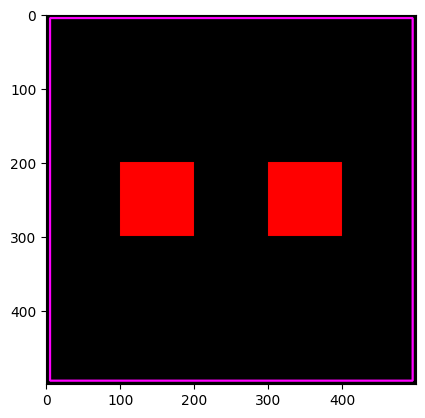

In [ ]:
cv.rectangle(blank, (5,5), (495, 495), (255, 0, 255), thickness=2)
# args: img, start point, end point, color, ketebalan
plt.imshow(blank)

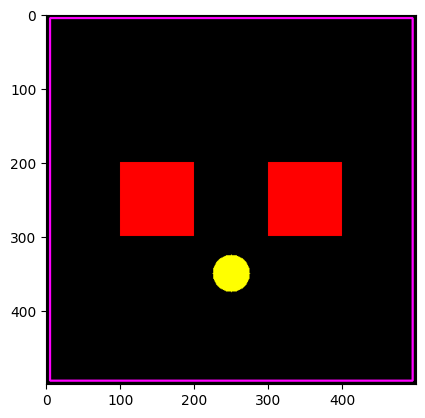

In [ ]:
cv.circle(blank, (blank.shape[1]//2, 350), 25, (255, 255, 0), thickness=-1)
plt.imshow(blank)

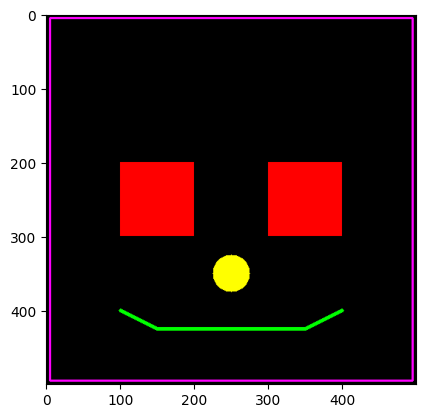

In [ ]:
cv.line(blank, (150, 425), (350, 425), (0, 255, 0), thickness=3)
cv.line(blank, (100, 400), (150, 425), (0, 255, 0), thickness=3)
cv.line(blank, (350, 425), (400, 400), (0, 255, 0), thickness=3)
plt.imshow(blank)

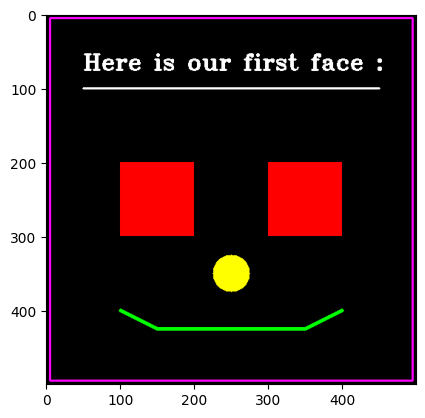

In [ ]:
cv.putText(blank, 'Here is our first face :', (50, 75), cv.FONT_HERSHEY_TRIPLEX, 1, (255,255,255), 2)
cv.line(blank, (50, 100), (450, 100), (255, 255, 255), thickness=2)
plt.imshow(blank)

# **Essential Function Uses**

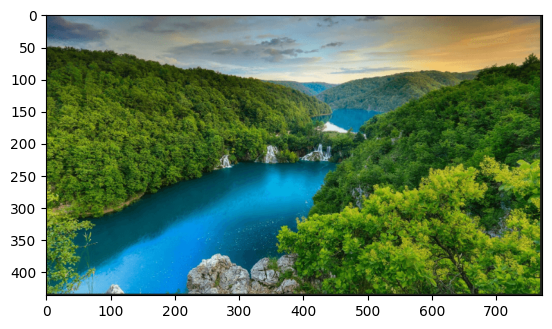

In [ ]:
# Grayscale

imgJungle = cv.imread('/content/drive/MyDrive/PCVK/jungle.png')
plt.imshow(cv.cvtColor(imgJungle, cv.COLOR_BGR2RGB))

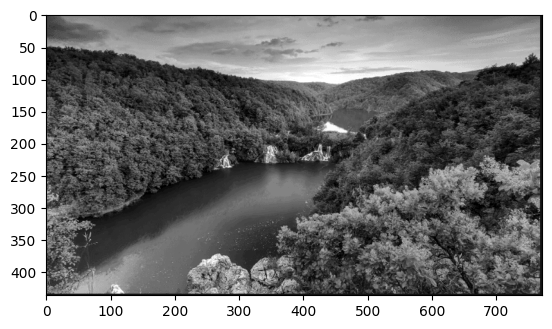

In [ ]:
grayJungle = cv.cvtColor(imgJungle, cv.COLOR_BGR2GRAY)
plt.imshow(grayJungle, cmap='gray')

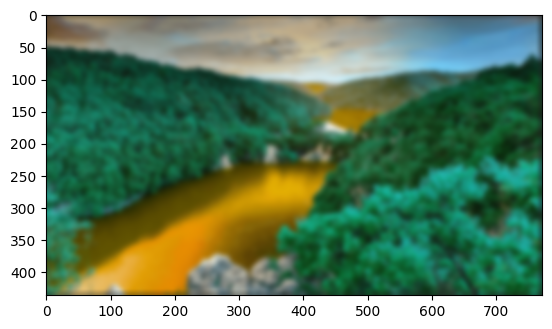

In [ ]:
blurJungle = cv.GaussianBlur(imgJungle, (17,17), cv.BORDER_DEFAULT)
plt.imshow(blurJungle)

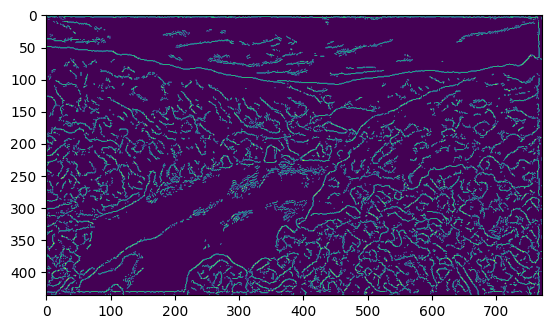

In [ ]:
cannyJungle = cv.Canny(blurJungle, 25, 25)
plt.imshow(cannyJungle)

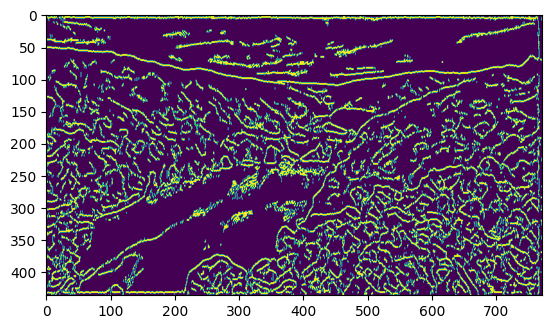

In [ ]:
dilatedJungle = cv.dilate(cannyJungle, (70, 70), iterations=2)
plt.imshow(dilatedJungle)

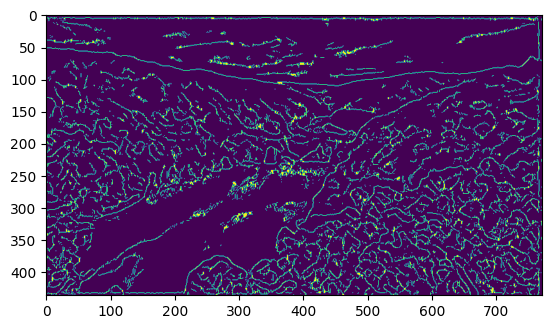

In [ ]:
erodedJungle = cv.erode(dilatedJungle, (70, 70), iterations=2)
plt.imshow(erodedJungle)

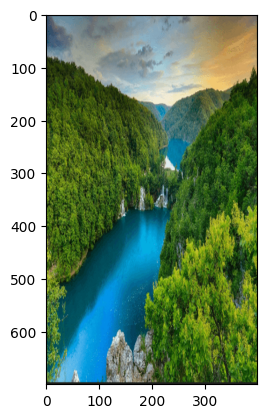

In [ ]:
resizedJungle = cv.resize(cv.cvtColor(imgJungle, cv.COLOR_BGR2RGB), (400, 700), interpolation=cv.INTER_CUBIC)
plt.imshow(resizedJungle)

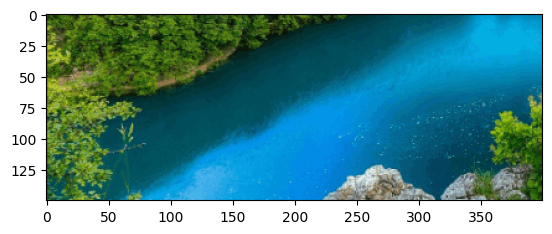

In [ ]:
croppedJungle = cv.cvtColor(imgJungle, cv.COLOR_BGR2RGB)[250:400, :400]
plt.imshow(croppedJungle)

# Image Transformation

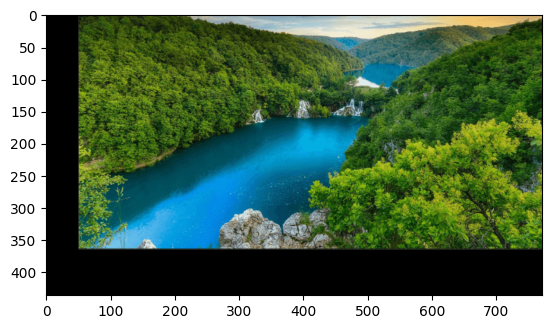

In [ ]:
imgJungle = cv.cvtColor(cv.imread('/content/drive/MyDrive/PCVK/jungle.png'), cv.COLOR_BGR2RGB)

def translate(img, x, y):
  translationMatrix = np.float32([[1,0,x], [0,1,y]])
  dimensions = (img.shape[1], img.shape[0])
  return cv.warpAffine(img, translationMatrix, dimensions)

# -x : left
# x : right
# -y : up
# y : down

translatedJungle = translate(imgJungle, 50, -70)
plt.imshow(translatedJungle)

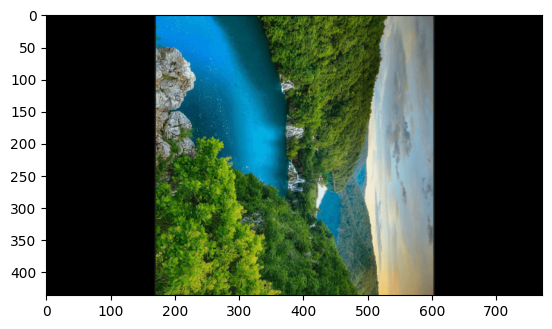

In [ ]:
def rotate(img, angle, rotationPoint=None):
  (h, w) = img.shape[:2]
  if rotationPoint is None:
    rotationPoint = (w//2, h//2)
  rotationMatrix = cv.getRotationMatrix2D(rotationPoint, angle, 1.0)
  dimensions = (w, h)
  return cv.warpAffine(img, rotationMatrix, dimensions)

rotatedJungle = rotate(imgJungle, -90)
plt.imshow(rotatedJungle)

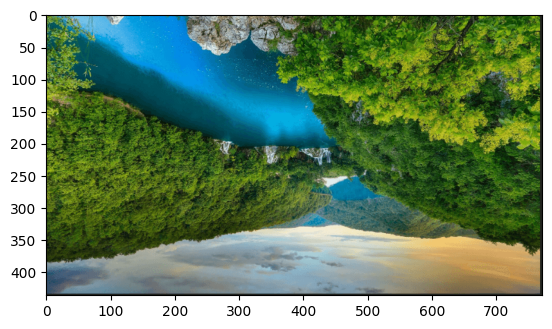

In [ ]:
flippedVerJungle = cv.flip(imgJungle, 0)
plt.imshow(flippedVerJungle)

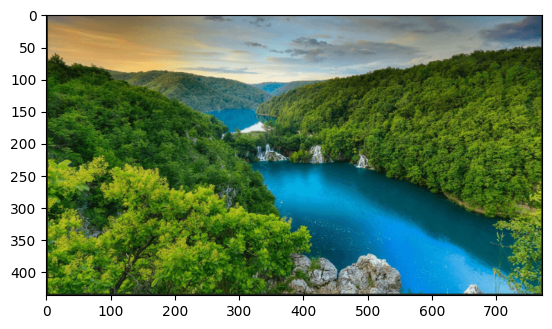

In [ ]:
flippedHorJungle = cv.flip(imgJungle, 1)
plt.imshow(flippedHorJungle)

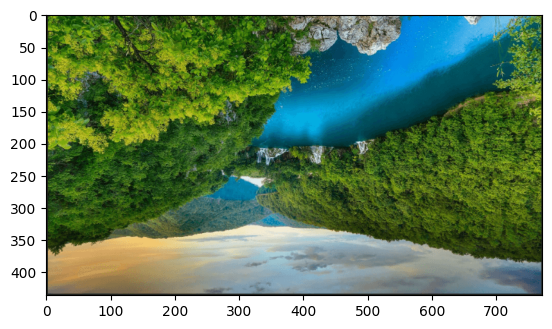

In [ ]:
flippedHorVerJungle = cv.flip(imgJungle, -1)
plt.imshow(flippedHorVerJungle)

# Contour Detection

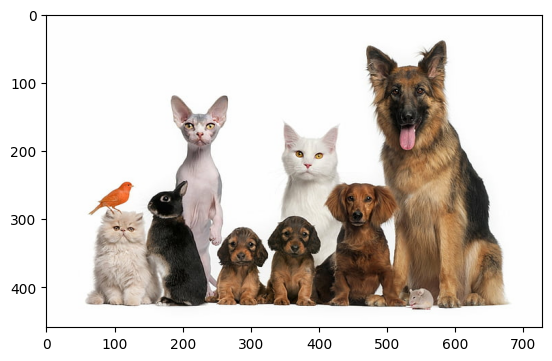

In [ ]:
imgAnimals = cv.cvtColor(cv.imread('/content/drive/MyDrive/PCVK/ObjectDetection/animal.jpg'), cv.COLOR_BGR2RGB)
plt.imshow(imgAnimals)

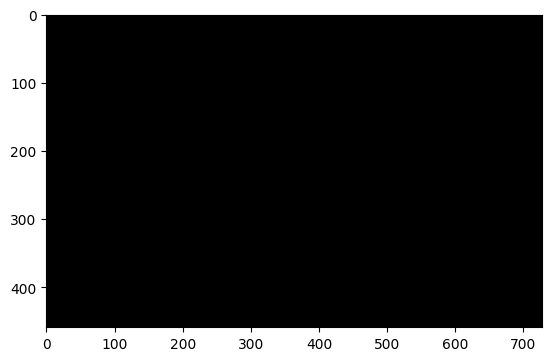

In [ ]:
blank = np.zeros(imgAnimals.shape, dtype='uint8')
plt.imshow(blank)

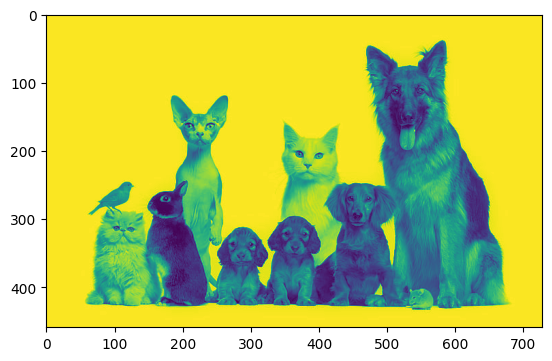

In [ ]:
grayAnimals = cv.cvtColor(imgAnimals, cv.COLOR_RGB2GRAY)
plt.imshow(grayAnimals)

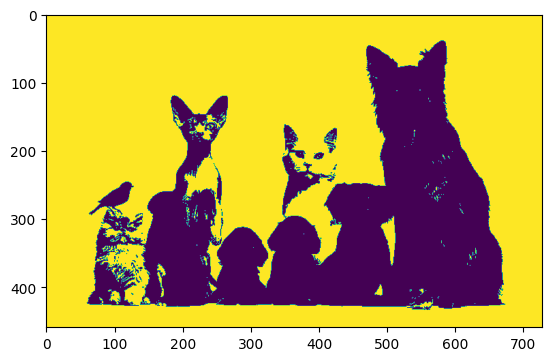

In [ ]:
res, thresh = cv.threshold(grayAnimals, 190, 255, cv.THRESH_BINARY)
plt.imshow(thresh)

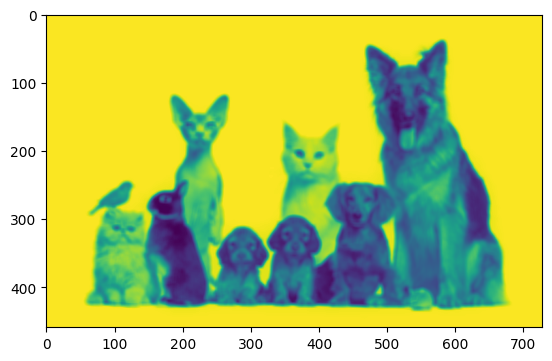

In [ ]:
blurAnimals = cv.GaussianBlur(grayAnimals, (7,7), cv.BORDER_DEFAULT)
plt.imshow(blurAnimals)

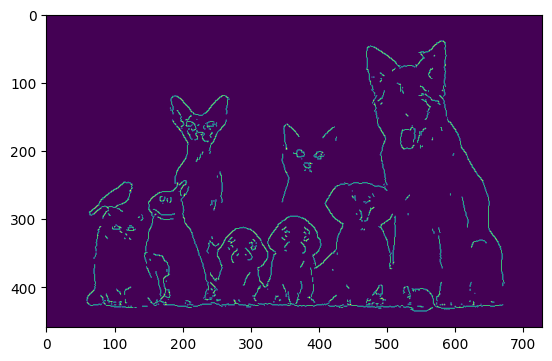

In [ ]:
cannyAnimals = cv.Canny(blurAnimals, 100, 105)
plt.imshow(cannyAnimals)

363


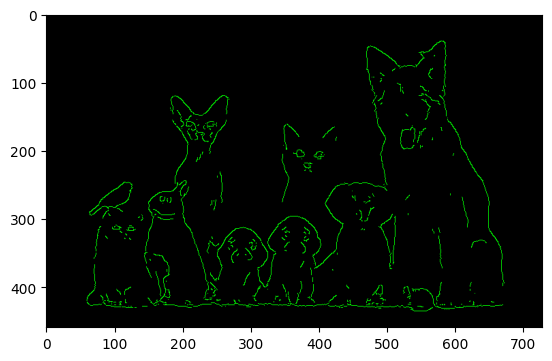

In [ ]:
contours, hierarchies = cv.findContours(cannyAnimals, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)
print(len(contours))

cv.drawContours(blank, contours, -1, (0, 255, 0), 1)
plt.imshow(blank)

# Color Spaces/Channels

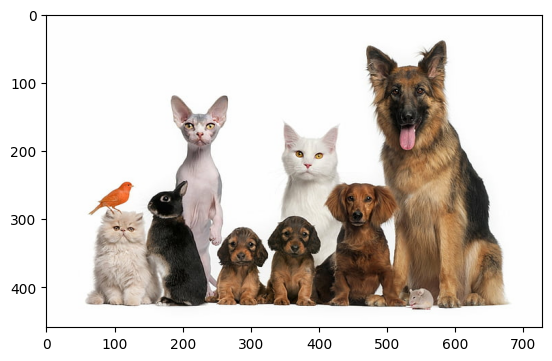

In [ ]:
imgAnimals = cv.cvtColor(cv.imread('/content/drive/MyDrive/PCVK/ObjectDetection/animal.jpg'), cv.COLOR_BGR2RGB)
plt.imshow(imgAnimals)

In [ ]:
blank = np.zeros(imgAnimals.shape[:2], dtype='uint8')
r,g,b = cv.split(imgAnimals)

red = cv.merge([r, blank, blank])
green = cv.merge([blank, g, blank])
blue = cv.merge([blank, blank, b])

print(imgAnimals.shape)
print(r.shape)
print(g.shape)
print(b.shape)

(459, 728, 3)
(459, 728)
(459, 728)
(459, 728)


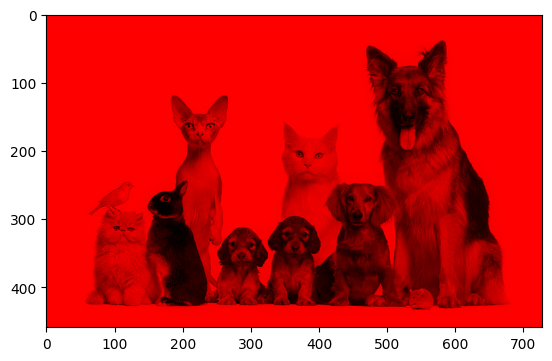

In [ ]:
plt.imshow(red)

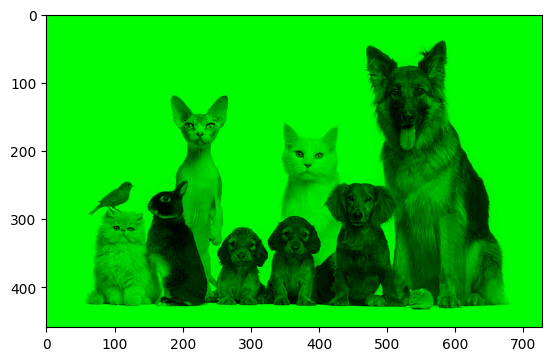

In [ ]:
plt.imshow(green)

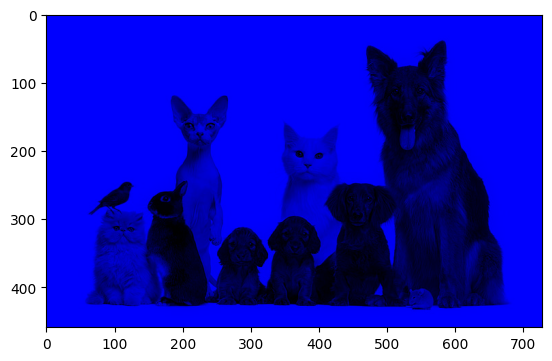

In [ ]:
plt.imshow(blue)

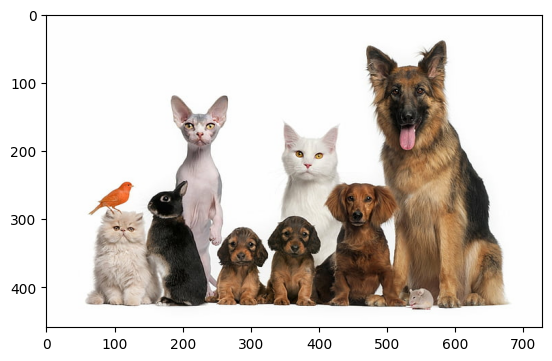

In [ ]:
mergedAnimals = cv.merge([r,g,b])
plt.imshow(mergedAnimals)

# Bitwise Operations

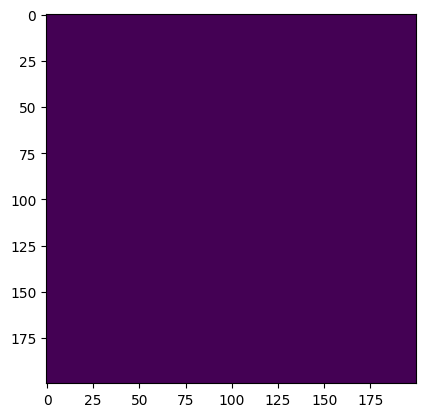

In [ ]:
blank = np.zeros((200, 200), dtype='uint8')
plt.imshow(blank)

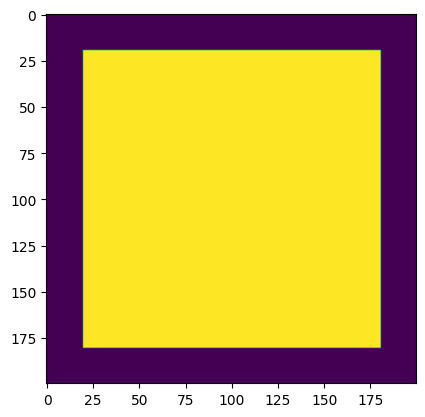

In [ ]:
rect = cv.rectangle(blank.copy(), (20,20), (180,180), 255, -1)
plt.imshow(rect)

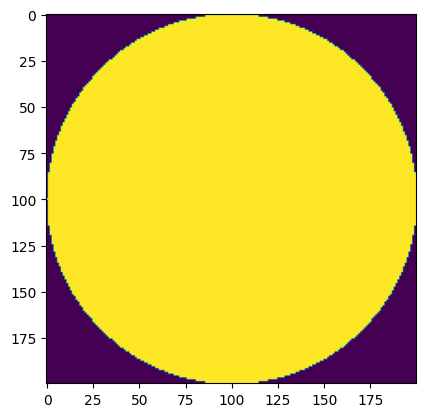

In [ ]:
circ = cv.circle(blank.copy(), (100,100), 100, 255, -1)
plt.imshow(circ)

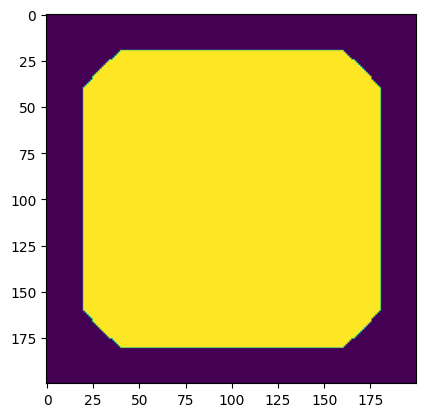

In [ ]:
shape_and = cv.bitwise_and(rect, circ)
plt.imshow(shape_and)

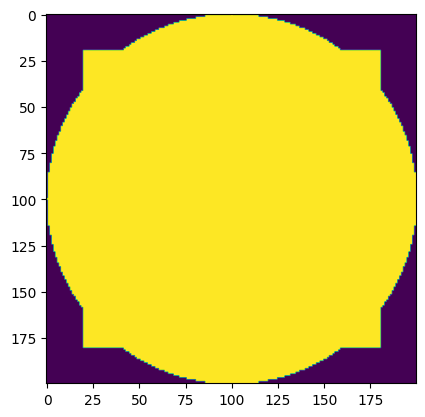

In [ ]:
shape_or = cv.bitwise_or(rect, circ)
plt.imshow(shape_or)

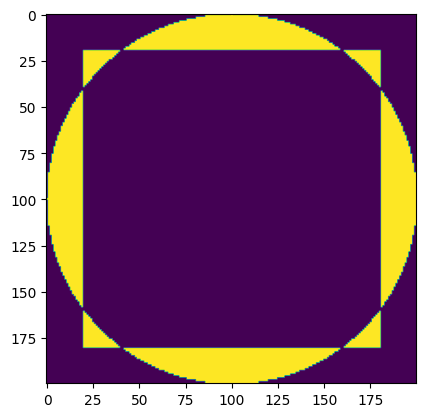

In [ ]:
shape_xor = cv.bitwise_xor(rect, circ)
plt.imshow(shape_xor)

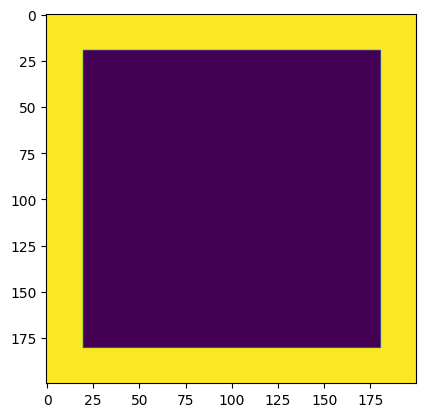

In [ ]:
shape_not = cv.bitwise_not(rect)
plt.imshow(shape_not)

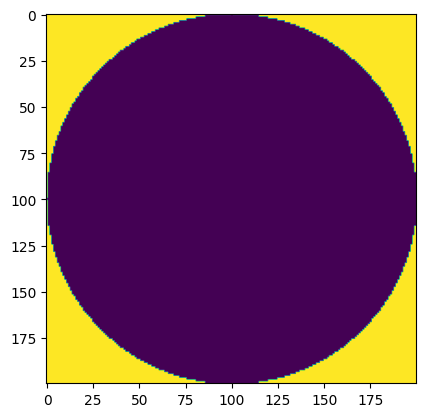

In [ ]:
shape_not = cv.bitwise_not(circ)
plt.imshow(shape_not)

# Masking

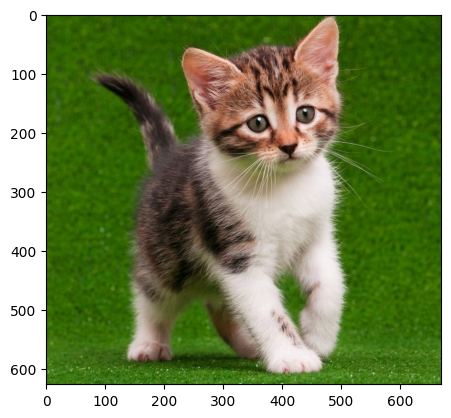

In [ ]:
imgCat = cv.cvtColor(cv.imread('/content/drive/MyDrive/PCVK/kitten01.jpg'), cv.COLOR_BGR2RGB)
plt.imshow(imgCat)

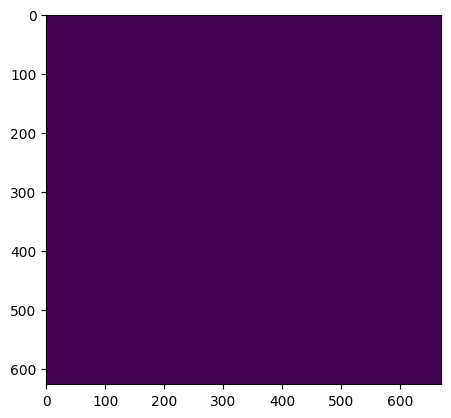

In [ ]:
blank = np.zeros(imgCat.shape[:2], dtype='uint8')
plt.imshow(blank)

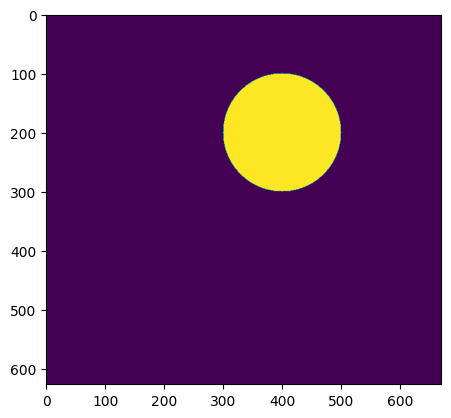

In [ ]:
maskCirc = cv.circle(blank, (400,200), 100, 255, -1)
plt.imshow(maskCirc)

In [ ]:
# maskRect = cv.rectangle(blank, (250,70), (510,300), 255, -1)
# plt.imshow(maskRect)

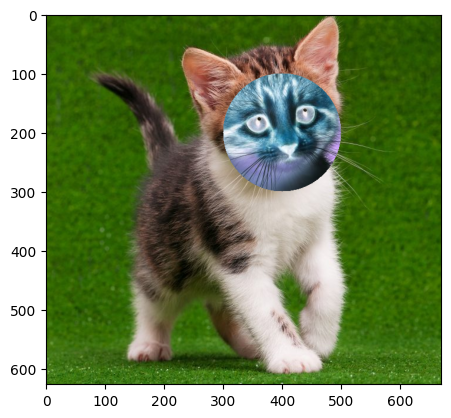

In [ ]:
focusHead = cv.bitwise_not(imgCat, imgCat, mask=maskCirc)
plt.imshow(focusHead)

# Computing Histogram

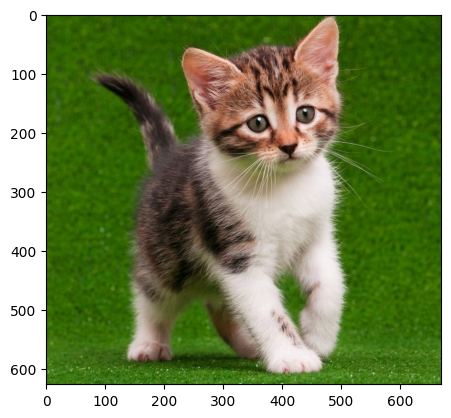

In [ ]:
imgCat = cv.cvtColor(cv.imread('/content/drive/MyDrive/PCVK/kitten01.jpg'), cv.COLOR_BGR2RGB)
plt.imshow(imgCat)

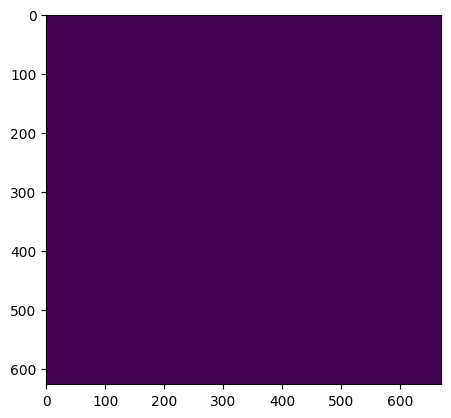

In [ ]:
blank = np.zeros(imgCat.shape[:2], dtype='uint8')
plt.imshow(blank)

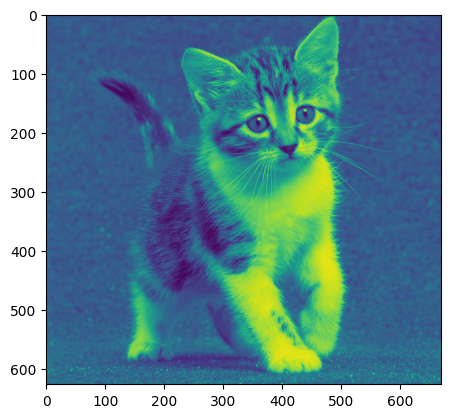

In [ ]:
grayCat = cv.cvtColor(imgCat, cv.COLOR_RGB2GRAY)
plt.imshow(grayCat)

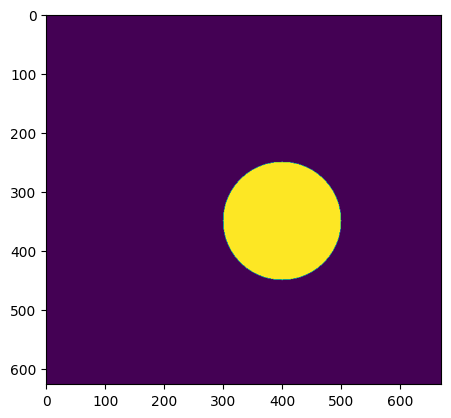

In [ ]:
maskCirc = cv.circle(blank, (400,350), 100, 255, -1)
plt.imshow(maskCirc)

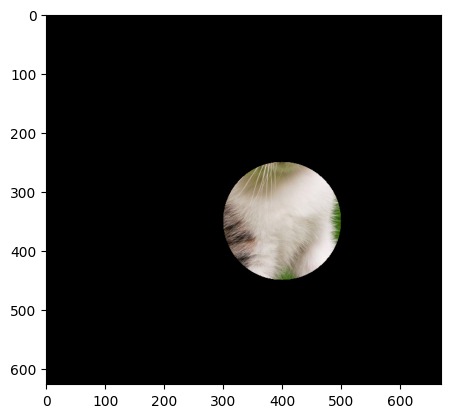

In [ ]:
# circCat = cv.bitwise_and(grayCat, maskCirc)
circCat = cv.bitwise_and(imgCat, imgCat, mask=maskCirc)
plt.imshow(circCat)

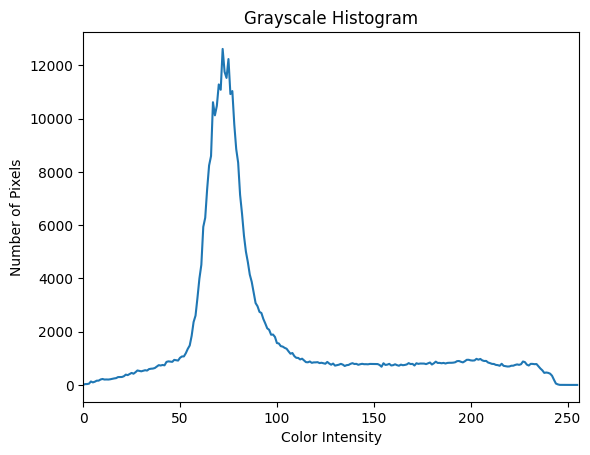

In [ ]:
# grayscale

histogram1 = cv.calcHist([grayCat], [0], maskCirc, [256], [0, 256])
histogram2 = cv.calcHist([grayCat], [0], None, [256], [0, 256])

plt.figure()
plt.title('Grayscale Histogram')
plt.xlabel('Color Intensity')
plt.ylabel('Number of Pixels')
plt.plot(histogram2)
plt.xlim([0,256])
plt.show()

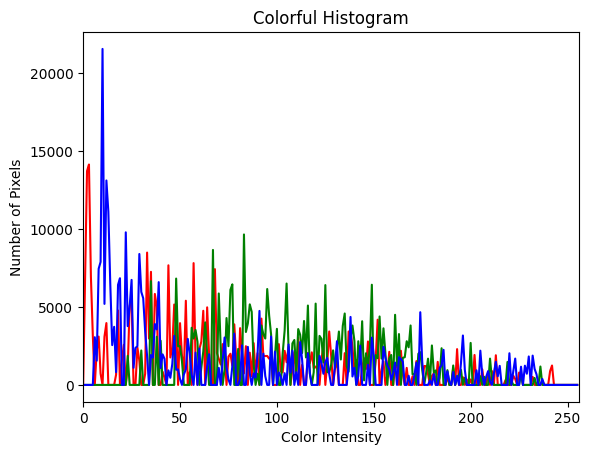

In [ ]:
# colorful
colors = ('r', 'g', 'b')

plt.figure()
plt.title('Colorful Histogram')
plt.xlabel('Color Intensity')
plt.ylabel('Number of Pixels')
for i, col in enumerate(colors):
  histogram = cv.calcHist([imgJungle], [i], None, [256], [0, 256])
  plt.plot(histogram, color=col)
  plt.xlim([0, 256])
plt.show()

# Thresholding

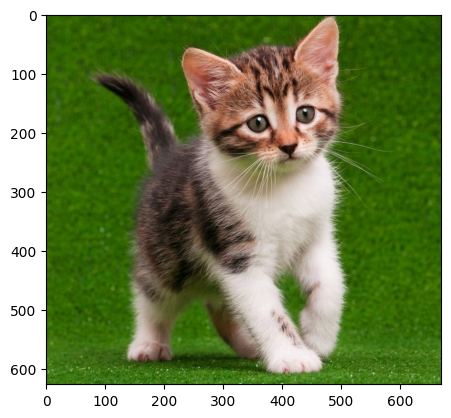

In [ ]:
imgCat = cv.cvtColor(cv.imread('/content/drive/MyDrive/PCVK/kitten01.jpg'), cv.COLOR_BGR2RGB)
plt.imshow(imgCat)

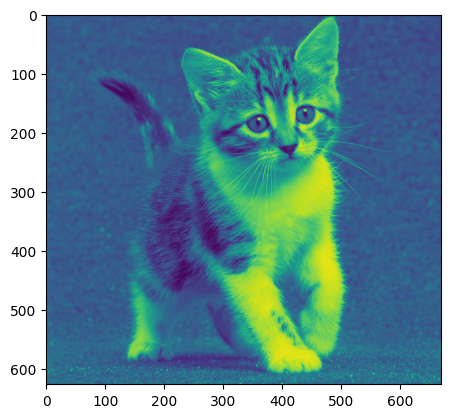

In [ ]:
grayCat = cv.cvtColor(imgCat, cv.COLOR_RGB2GRAY)
plt.imshow(grayCat)

## Simple Thresholding

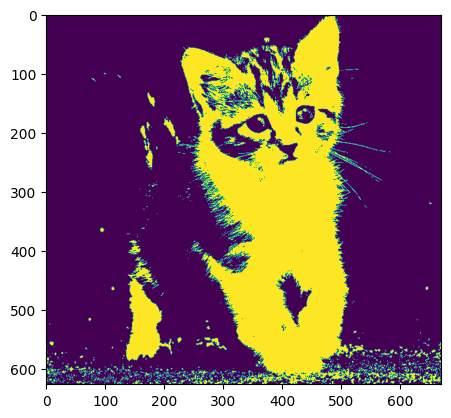

In [ ]:
threshold, imgThresh = cv.threshold(grayCat, 100, 255, cv.THRESH_BINARY)
plt.imshow(imgThresh)

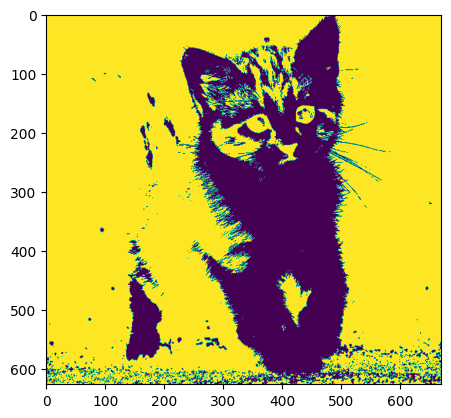

In [ ]:
threshold_inv, imgThresh_inv = cv.threshold(grayCat, 100, 255, cv.THRESH_BINARY_INV)
plt.imshow(imgThresh_inv)

## Adaptive Thresholding

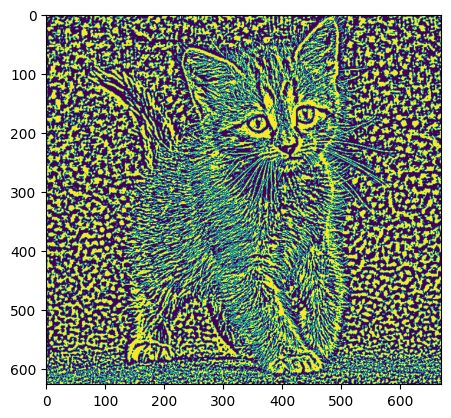

In [ ]:
imgThresh_adaptive = cv.adaptiveThreshold(grayCat, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 9, 0)
plt.imshow(imgThresh_adaptive)

# Edge Detection

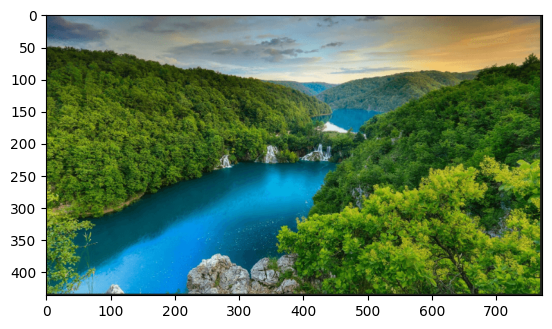

In [ ]:
imgJungle = cv.cvtColor(cv.imread('/content/drive/MyDrive/PCVK/jungle.png'), cv.COLOR_BGR2RGB)
plt.imshow(imgJungle)

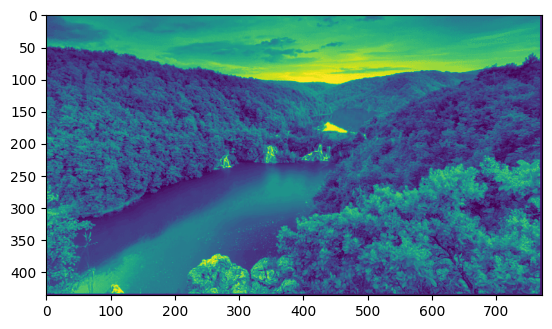

In [ ]:
grayJungle = cv.cvtColor(imgJungle, cv.COLOR_RGB2GRAY)
plt.imshow(grayJungle)

## Laplacian

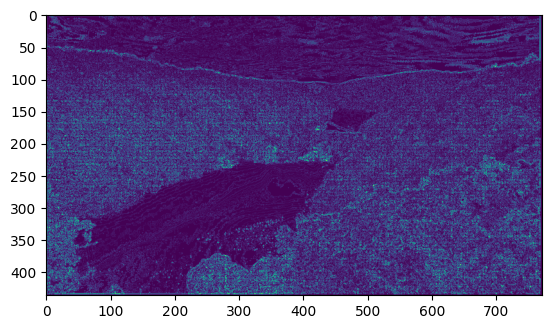

In [ ]:
lap = cv.Laplacian(grayJungle, cv.CV_64F)
lap = np.uint8(np.absolute(lap))
plt.imshow(lap)

## Sobel

/usr/local/lib/python3.10/dist-packages/matplotlib/image.py:484: RuntimeWarning: invalid value encountered in subtract
  A_scaled -= a_min


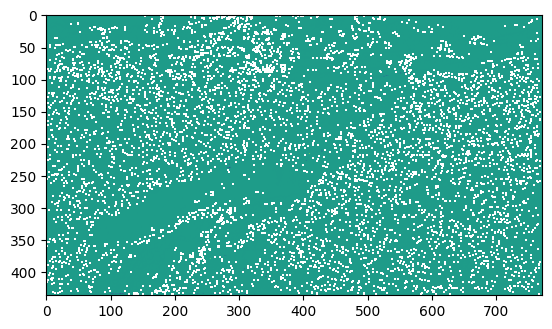

In [ ]:
sobelX = cv.Sobel(grayJungle, cv.CV_64F, 1, 0)
sobelY = cv.Sobel(grayJungle, cv.CV_64F, 0, 1)
sobelCombined = cv.bitwise_or(sobelX, sobelY)
plt.imshow(sobelCombined)

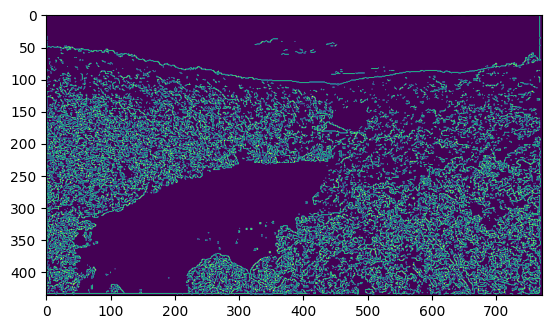

In [ ]:
canny = cv.Canny(grayJungle, 150, 170)
plt.imshow(canny)

# Face Detection

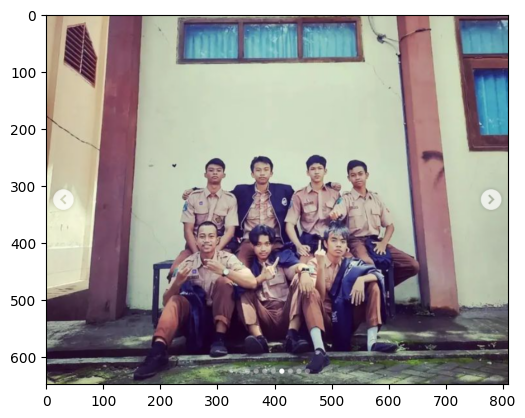

In [ ]:
imgFace = cv.cvtColor(cv.imread('/content/drive/MyDrive/PCVK/belajar/smdplp.png'), cv.COLOR_BGR2RGB)
# imgFace = cv.cvtColor(cv.imread('/content/drive/MyDrive/PCVK/belajar/jempol.JPG'), cv.COLOR_BGR2RGB)
plt.imshow(imgFace)

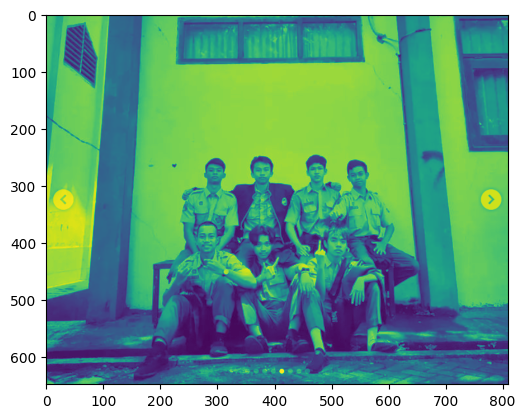

In [ ]:
grayFace = cv.cvtColor(imgFace, cv.COLOR_RGB2GRAY)
plt.imshow(grayFace)

7


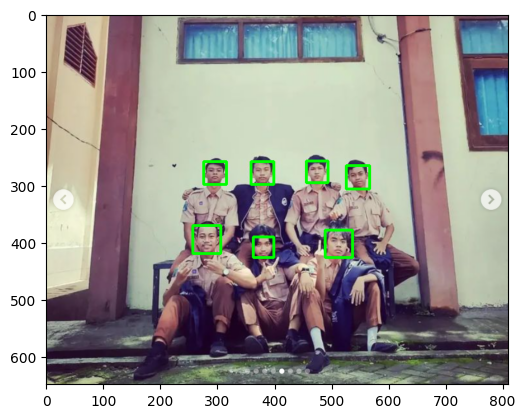

In [ ]:
haarCascade = cv.CascadeClassifier('/content/drive/MyDrive/PCVK/belajar/haarcascade_frontalface_default.xml')
facesDetected = haarCascade.detectMultiScale(grayFace, scaleFactor=1.1, minNeighbors=10)
print(len(facesDetected))

for (x, y, w, h) in facesDetected:
  cv.rectangle(imgFace, (x,y), (x+w, y+h), (0,255,0), thickness=3)

plt.imshow(imgFace)

# Face Recognition

## Loading Images and Detecting Faces

In [ ]:
import os
import cv2 as cv

folder_path = '/content/drive/MyDrive/PCVK/belajar/Faces'
haarCascade = cv.CascadeClassifier('/content/drive/MyDrive/PCVK/belajar/haarcascade_frontalface_default.xml')

# Ambil nama semua sub-folder
people = [f for f in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, f))]

# Tampilkan nama-nama folder
print(people)

features = []
labels = []
imgs = []

def createTrain():
    for person in people:
        path = os.path.join(folder_path, person)
        label = people.index(person)
        img_count = 0  # Counter untuk jumlah gambar
        for img in os.listdir(path):
            img_path = os.path.join(path, img)
            imgs.append(img_path)
            img_array = cv.imread(img_path)
            gray = cv.cvtColor(img_array, cv.COLOR_BGR2GRAY)
            faces_reco = haarCascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=4)
            img_count += 1  # Tambah counter gambar
            if len(faces_reco) == 0:
              print(f"No face detected in {img_path}. Skipping.")
              continue
            if len(faces_reco) > 0:
              # Pilih wajah pertama yang terdeteksi
              print(f"Detected face in {img_path}: {len(faces_reco)} faces")
              (x, y, w, h) = faces_reco[0]
              faces_roi = gray[y:y+h, x:x+w]
              features.append(faces_roi)
              labels.append(label)
              if len(faces_reco) > 1:
                print(f"Warning: Multiple faces detected in {img_path}. Skipping this image.")
                continue
        print(f"Jumlah gambar di folder {person}: {img_count}")

createTrain()
print(f"Jumlah img: {len(features)}")
print(f"Jumlah label: {len(labels)}")
print(f"Jumlah total gambar: {len(imgs)}")

['arnoldschwarzenegger', 'jasonstatham', 'johncena', 'sylvesterstallone']
Detected face in /content/drive/MyDrive/PCVK/belajar/Faces/arnoldschwarzenegger/28c2b470956863ec76941beeb2cb0903.jpg: 1 faces
No face detected in /content/drive/MyDrive/PCVK/belajar/Faces/arnoldschwarzenegger/8b5fd99a08bf87f0fbf077ac366d5fa5.jpg. Skipping.
Detected face in /content/drive/MyDrive/PCVK/belajar/Faces/arnoldschwarzenegger/8f4e5112ba640faa9c20bf26e673f8cd.jpg: 1 faces
Detected face in /content/drive/MyDrive/PCVK/belajar/Faces/arnoldschwarzenegger/99dfa5b45fe8e939e380f4f6aae5bf16.jpg: 1 faces
Detected face in /content/drive/MyDrive/PCVK/belajar/Faces/arnoldschwarzenegger/6bbb8d31b17bb7608a9eac503e700536.jpg: 1 faces
Detected face in /content/drive/MyDrive/PCVK/belajar/Faces/arnoldschwarzenegger/940cf198979b25e9c376411a559472a7.jpg: 1 faces
Detected face in /content/drive/MyDrive/PCVK/belajar/Faces/arnoldschwarzenegger/c361b4ee7f30ad2b50d81a35c8d0da77.jpg: 1 faces
Detected face in /content/drive/MyDrive

## Training Detected Faces

In [ ]:
print(features)

[array([[ 26,  29,   9, ..., 116, 115, 116],
       [ 34,  38,  20, ..., 115, 115, 116],
       [ 26,  25,  47, ..., 115, 117, 117],
       ...,
       [ 35,  33,  42, ...,  33,  34,  34],
       [ 43,  48,  36, ...,  30,  34,  32],
       [ 33,  36,  37, ...,  31,  30,  30]], dtype=uint8), array([[  1,   1,   1, ...,   2,   0,   0],
       [  1,   1,   1, ...,   2,   1,   0],
       [  1,   1,   1, ...,   1,   4,  14],
       ...,
       [  1,   1,   1, ..., 154, 185, 120],
       [  1,   1,   1, ..., 165, 184, 132],
       [  1,   1,   1, ..., 169, 179, 154]], dtype=uint8), array([[ 12,  11,  10, ...,  92, 101, 115],
       [ 12,  11,  11, ..., 132, 125, 121],
       [ 11,  11,  12, ..., 127, 133, 121],
       ...,
       [131, 131, 132, ..., 101, 101, 109],
       [131, 131, 132, ..., 102, 103, 111],
       [131, 131, 132, ..., 108, 111, 114]], dtype=uint8), array([[126, 130, 133, ...,  92,  92,  93],
       [121, 123, 124, ...,  91,  92,  92],
       [123, 128, 131, ...,  91,  91, 

## Recognize Faces

In [ ]:
features = np.array(features, dtype='object')
labels = np.array(labels)

face_recognizer = cv.face.LBPHFaceRecognizer_create()
face_recognizer.train(features, labels)
face_recognizer.save('faces_trained.yml')

np.save('features.npy', features)
np.save('labels.npy', labels)

he/she is arnoldschwarzenegger with a confidence level of 63.169927303856674.


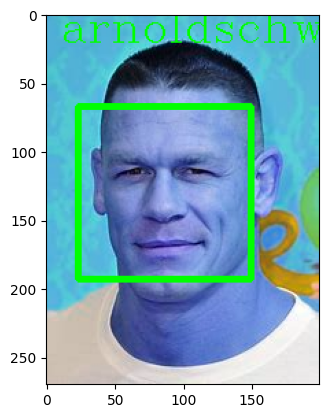

In [ ]:
haarCascade = cv.CascadeClassifier('/content/drive/MyDrive/PCVK/belajar/haarcascade_frontalface_default.xml')
features = np.load('features.npy', allow_pickle=True)
labels = np.load('labels.npy')

face_recognizer = cv.face.LBPHFaceRecognizer_create()
face_recognizer.read('faces_trained.yml')

img = cv.imread('/content/drive/MyDrive/PCVK/belajar/Faces/tests/JC2.jpeg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

faces_reco = haarCascade.detectMultiScale(img_gray, 1.1, 4)
for (x,y,w,h) in faces_reco:
  faces_roi = img_gray[y:y+h, x:x+h]
  label, confidence = face_recognizer.predict(faces_roi)
  print(f"he/she is {people[label]} with a confidence level of {confidence}.")
  cv.putText(img, str(people[label]), (10,20), cv.FONT_HERSHEY_COMPLEX, 1.0, (0,255,0), thickness=1)
  cv.rectangle(img, (x,y), (x+w,y+h), (0,255,0), thickness=3)
  # if len(faces_reco) > 1:
  #   print(f"Warning: Multiple faces detected!")
  #   break

plt.imshow(img)